# Detector Complete-Network Training

This notebook studies the training of the whole of detection network, namely both the Resnet-based feature-extractor and the RPN+location head.

**The complete-network-training seems to slightly improve the results compared to RPN training on top of a freezed pre-trained Resnet.**

Hyper parameters (tested in a few undocumented experiments):
- As expected, the best learning rate (0.0003) was found to be smaller than the one used for head-only training.
- The number of epochs (12) should also be small since overfitting begins quite early in this already-trained network.
- Other hyper-parameters were kept as in the head-only training.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import DetectorNetwork as dn

import os, sys, time, datetime, random
from pathlib import Path
from warnings import warn
from tqdm import tqdm, tnrange, tqdm_notebook
import pickle as pkl
import gc

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from collections import Counter, OrderedDict
import cv2
from PIL import Image

import torch as t
from torch import nn
from torch.nn import functional as F
from torch.autograd import Variable
from torch import optim

In [3]:
mpl.rcParams.update({'font.size': 14})

In [11]:
MODELS_PATH = Path('models')
HEAD_NAME = 'head_10images.mdl'
OBJ_LOSS = 1/10
EPOCHS = 12
LR = 0.0003
BS = 64
I_TRAIN = list(range(10))
I_VALID = list(range(10,12))
I_DISPLAY = (1,6,8,10,11)

## Train Complete Model

In [5]:
# Images
files, images, W, H, i_used_images = dn.get_training_images(verbose=False)
inputs = dn.ims2vars(images, verbose=False)
# Labels
labels, locations, anchors = dn.get_training_labels(labs_path=r'labels/anchor_labels_9.pkl', verbose=True)
anchor_locs = dn.get_anchors_location_map(anchors)
loc_fac = dn.LocationFactory(anchors, H, W)

(291600, 12) (291600, 4, 12) (291600, 4)


In [6]:
# Load head
head = dn.RPN(in_channels=128, loc_features=True)
head.load_state_dict(t.load(MODELS_PATH/HEAD_NAME))

# Load base model
conv = dn.get_resnet_conv_model()

Network channels: 128 -> (skipped) -> 128 -> 45


In [7]:
# Complete detection model
model = dn.DetectionNetwork(conv, head)
full_optimizer = optim.Adam(model.parameters())

Train/valid images:	10 / 2


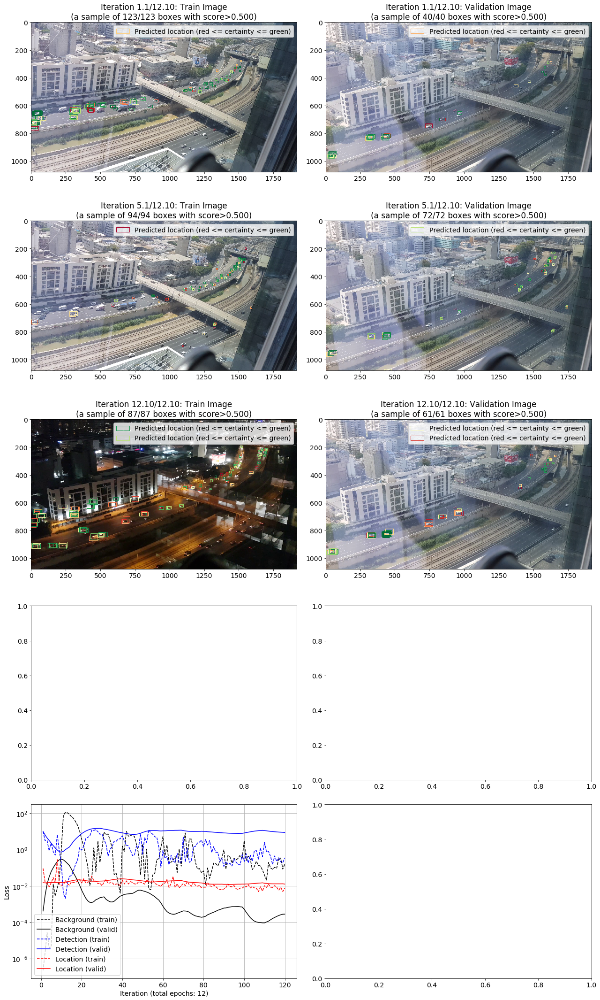

In [8]:
# Train
losses = \
    dn.train_model(model, full_optimizer, images, inputs, labels, locations, loc_fac, anchor_locs, anchors=None,
                   epochs=EPOCHS, lr=LR, bs=BS, lab2loc_loss_ratio=20, object_overweight=OBJ_LOSS,
                   i_train=I_TRAIN, i_valid=I_VALID, verbose=1, plot_freq=3)

#### Reload original model (pretrained Resnet + trained RPN) and compare to the fully-trained model:

In [16]:
head0 = dn.RPN(in_channels=128, loc_features=True)
head0.load_state_dict(t.load(MODELS_PATH/HEAD_NAME))
conv0 = dn.get_resnet_conv_model()
model0 = dn.DetectionNetwork(conv0, head0)
dn.to_device(model0, [])

Network channels: 128 -> (skipped) -> 128 -> 45


[]

In [17]:
res = dn.summarize_experiment('Freezed', model0, images, inputs, labels, locations,
                              20, OBJ_LOSS, I_TRAIN, anchor_locs=anchor_locs, loc_fac=loc_fac)
res = pd.concat((res, dn.summarize_experiment('Un-freezed', model, images, inputs, labels, locations,
                                              20, OBJ_LOSS, I_TRAIN, anchor_locs=anchor_locs, loc_fac=loc_fac) ))

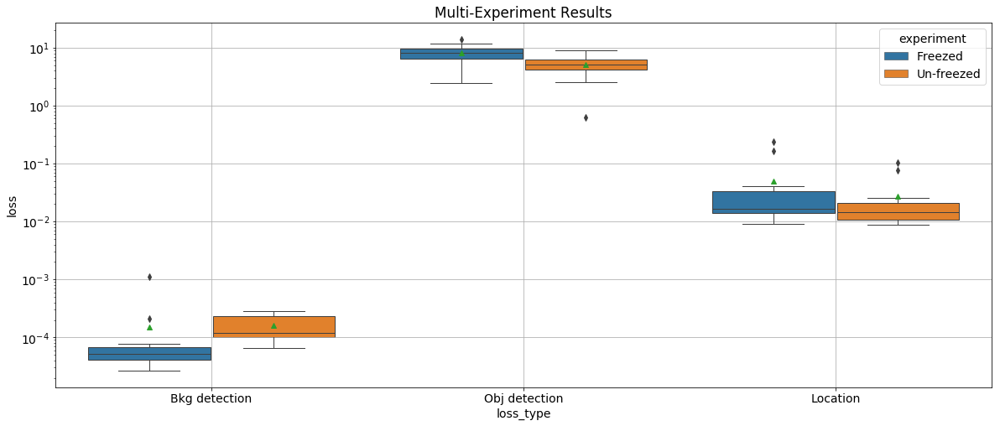

In [19]:
plt.figure(figsize=(20,8))
sns.boxplot(data=res, x='loss_type', y='loss', hue='experiment', showmeans=True, linewidth=1)
plt.title('Multi-Experiment Results')
plt.yscale('log')
plt.grid()

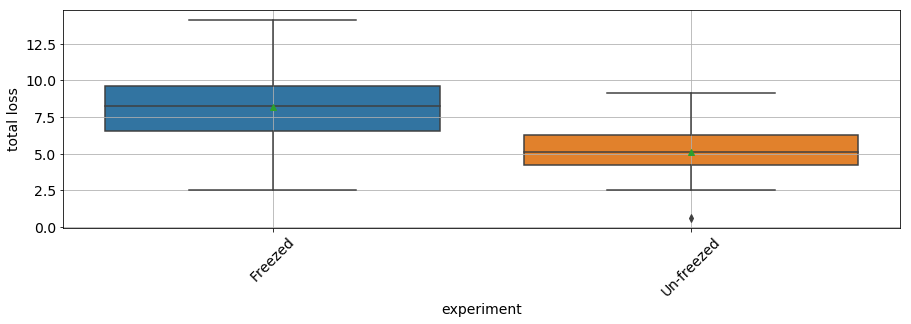

In [20]:
s = res.groupby(['experiment','image'])['loss'].apply(sum)
agg_res = pd.DataFrame({'experiment':s.index.levels[0][s.index.labels[0]], 'total loss':s})
plt.figure(figsize=(15,4))
sns.boxplot(data=agg_res, x='experiment', y='total loss', showmeans=True)
plt.xticks(rotation=45)
plt.grid()

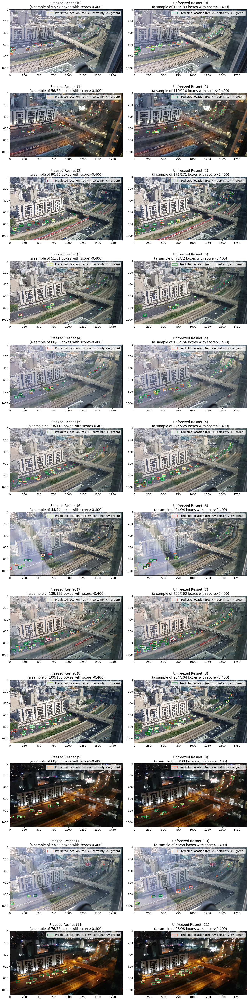

In [22]:
dn.compare_preds(model0, model, images, inputs, labels, locations, anchor_locs, loc_fac,
                 thresh=0.4, ids=list(range(12)), models_names=('Freezed Resnet','Unfreezed Resnet'))